In [1]:
import numpy as np
import matplotlib.pyplot as plt
import mkl
import random

from IPython.display import display, HTML
from matplotlib.animation import FuncAnimation

np.random.seed(1234)
mkl.set_num_threads(4)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = [16, 9]

# Tworzenie planszy modelowej i losowy wybor poczatkowych infekcji

In [2]:
def createPlain(n,m,chosen): # 0 - Komorka w stanie S / 1 - Komorka w stanie I / -1 - Komorka w stanie R
    plain = np.zeros((n,n))
    for i in range(m):
        point = (random.randint(0,n-1),random.randint(0,n-1))
        chosen.append(point)
        plain[point[0]][point[1]] = 1
    
    return plain

# Modelowanie epidemii za pomocą modelu SIR

In [3]:
def cellularAutomata(n,m,ratio):
    infected = []
    immune = []
    neutral = []
    populations = []
    table = createPlain(n,m,infected)
    for i in range(n):
        for j in range(n):
            if(table[i][j]==0):
                neutral.append((i,j))
    
    populations.append((len(infected),len(neutral),len(immune)))
    while(len(neutral) > 0):
        i = 0
        if(len(infected)==0):
            break
        el = infected[i%len(infected)]
        c = random.uniform(0.0,1.0)
        #print(c)
        if c < ratio:
            infected = infected[0:i] + infected[i+1:]
            immune.append(el)
            table[el[0]][el[1]] = -1
        else:
            a,b = el[0],el[1]
            neighbours = [(a-1,b),(a,b-1),(a+1,b),(a,b+1),(a-1,b-1),(a+1,b+1),(a-1,b+1),(a+1,b-1)]
            choose = []
            for p in neighbours:
                if(p[0] < n and p[0] >=0):
                    if(p[1] < n and p[1] >=0):
                        if(p in neutral):
                            choose.append(p)
            if len(choose) > 1:    
                index = random.randint(0,len(choose)-1)
                neutral.remove(choose[index])
                infected.append(choose[index])
                table[choose[index][0]][choose[index][1]] = 1
            i+=1
        
        populations.append((len(infected),len(neutral),len(immune)))
        if(i > len(infected)):
            i = 0
        
        #print(table)
        #print(populations)
    return neutral,populations

# Modelowanie epidemii za pomocą modelu SIR (wersja do wizualizacji)

In [4]:
def cellularAutomataAnimation(n,m,ratio):
    infected = []
    immune = []
    neutral = []
    populations = []
    res = []
    table = createPlain(n,m,infected)
    for i in range(n):
        for j in range(n):
            if(table[i][j]==0):
                neutral.append((i,j))
    
    res.append(np.copy(table))
    populations.append((len(infected),len(neutral),len(immune)))
    while(len(neutral) > 0):
        i = 0
        if(len(infected)==0):
            break
        el = infected[i%len(infected)]
        c = random.uniform(0.0,1.0)
        #print(c)
        if c < ratio:
            infected = infected[0:i] + infected[i+1:]
            immune.append(el)
            table[el[0]][el[1]] = -1
        else:
            a,b = el[0],el[1]
            neighbours = [(a-1,b),(a,b-1),(a+1,b),(a,b+1),(a-1,b-1),(a+1,b+1),(a-1,b+1),(a+1,b-1)]
            choose = []
            for p in neighbours:
                if(p[0] < n and p[0] >=0):
                    if(p[1] < n and p[1] >=0):
                        if(p in neutral):
                            choose.append(p)
            if len(choose) > 1:    
                index = random.randint(0,len(choose)-1)
                neutral.remove(choose[index])
                infected.append(choose[index])
                table[choose[index][0]][choose[index][1]] = 1
            i+=1
        
        populations.append((len(infected),len(neutral),len(immune)))
        if(i > len(infected)):
            i = 0
        
        res.append(np.copy(table))
    return res

## Symulacja dla 100 pól, 5 poczatkowych infekcji oraz szansy na ozdrowienie równej 0.3

In [5]:
t = cellularAutomata(10,5,0.3)
t2 = cellularAutomataAnimation(10,5,0.3)

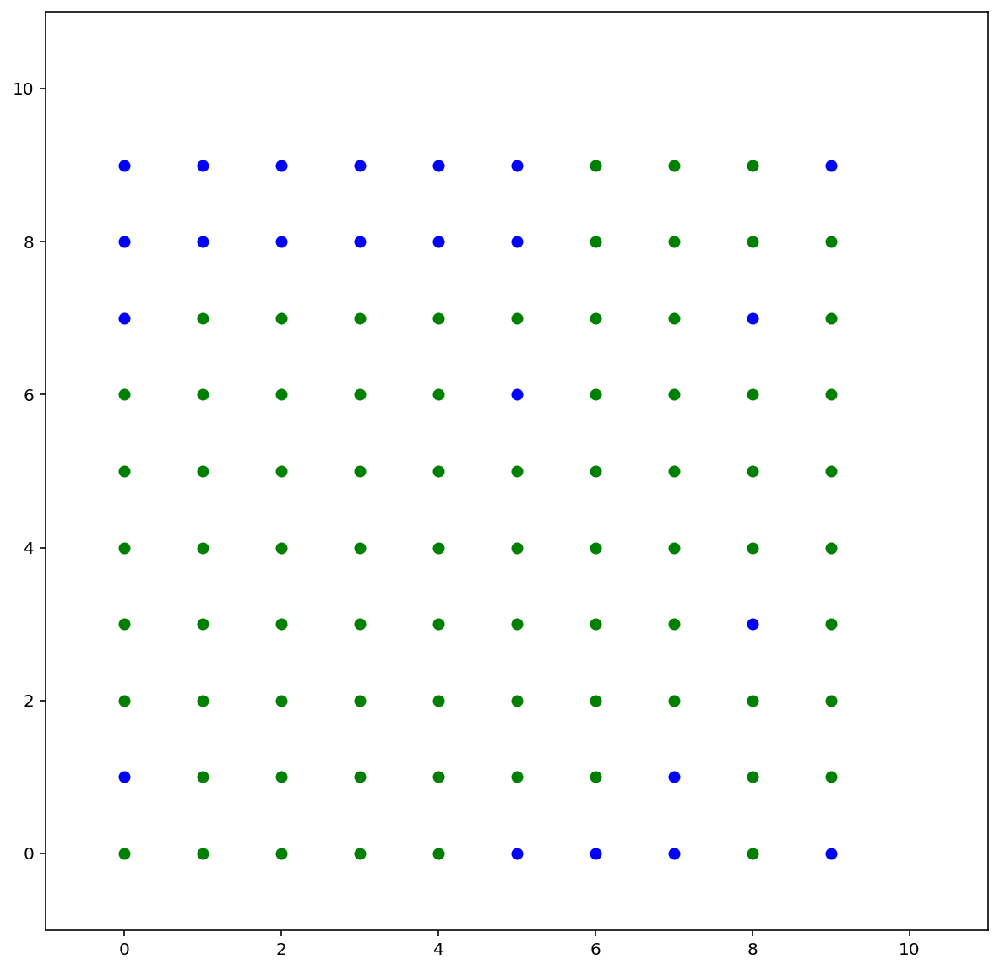

In [6]:
figure, axis = plt.subplots(figsize=(10, 10))
first, = plt.plot([], [], 'bo')
second, = plt.plot([], [], 'ro')
third, = plt.plot([], [], 'go')
n = 10
def update(idx):
    values = t2[idx]
    x1 = []
    x2 = []
    x3 = []
    y1 = []
    y2 = []
    y3 = []
    for i in range(n):
        for j in range(n):
            if(values[i][j] == 0):
                x1.append(i)
                y1.append(j)
            elif(values[i][j] == 1):
                x2.append(i)
                y2.append(j)
            else:
                x3.append(i)
                y3.append(j)
    
    first.set_data((x1,y1))
    second.set_data((x2,y2))
    third.set_data((x3,y3))
    return first,second,third


def init():
    axis.set_xlim((-1, 11))
    axis.set_ylim((-1, 11))
    return first,second,third


animation = FuncAnimation(figure, update, init_func=init, frames=len(t2),interval = 500)
HTML(animation.to_html5_video())

# Statystyki komórek w automacie

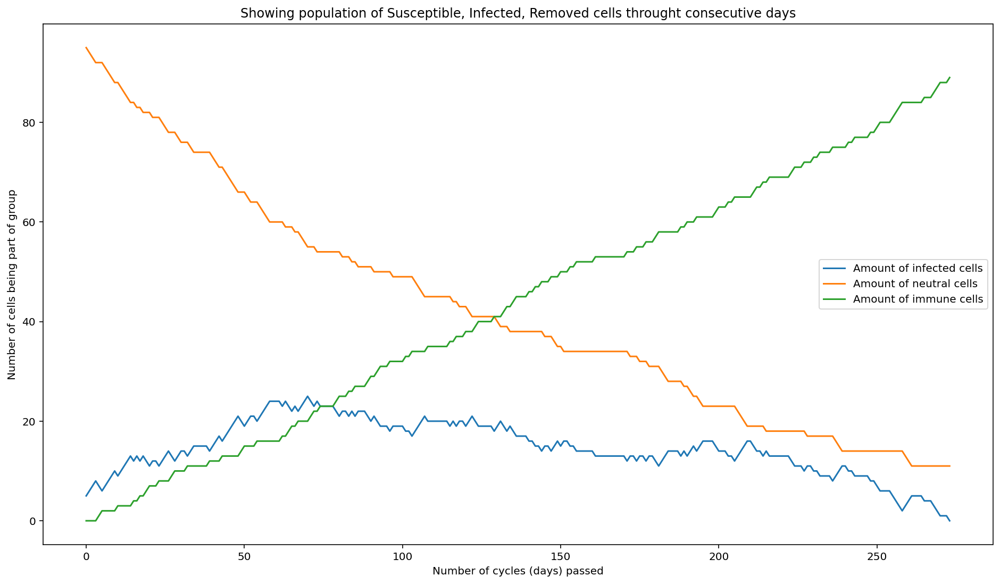

In [7]:
y = []
y2 = []
y3 = []
for el in t[1]:
    y.append(el[0])
    y2.append(el[1])
    y3.append(el[2])
    
y = np.array(y)
y2 = np.array(y2)
y3 = np.array(y3)
x = np.arange(0,len(t[1]),1)
plt.plot(x,y,label = 'Amount of infected cells')
plt.plot(x,y2,label = 'Amount of neutral cells')
plt.plot(x,y3,label = 'Amount of immune cells')
plt.title('Showing population of Susceptible, Infected, Removed cells throught consecutive days')
plt.xlabel('Number of cycles (days) passed')
plt.ylabel('Number of cells being part of group')
plt.legend()
plt.show()

## Symulacja dla 625 pól, 10 poczatkowych infekcji oraz szansy na ozdrowienie równej 0.2

In [8]:
t = cellularAutomata(25,10,0.2)
t2 = cellularAutomataAnimation(25,10,0.2)

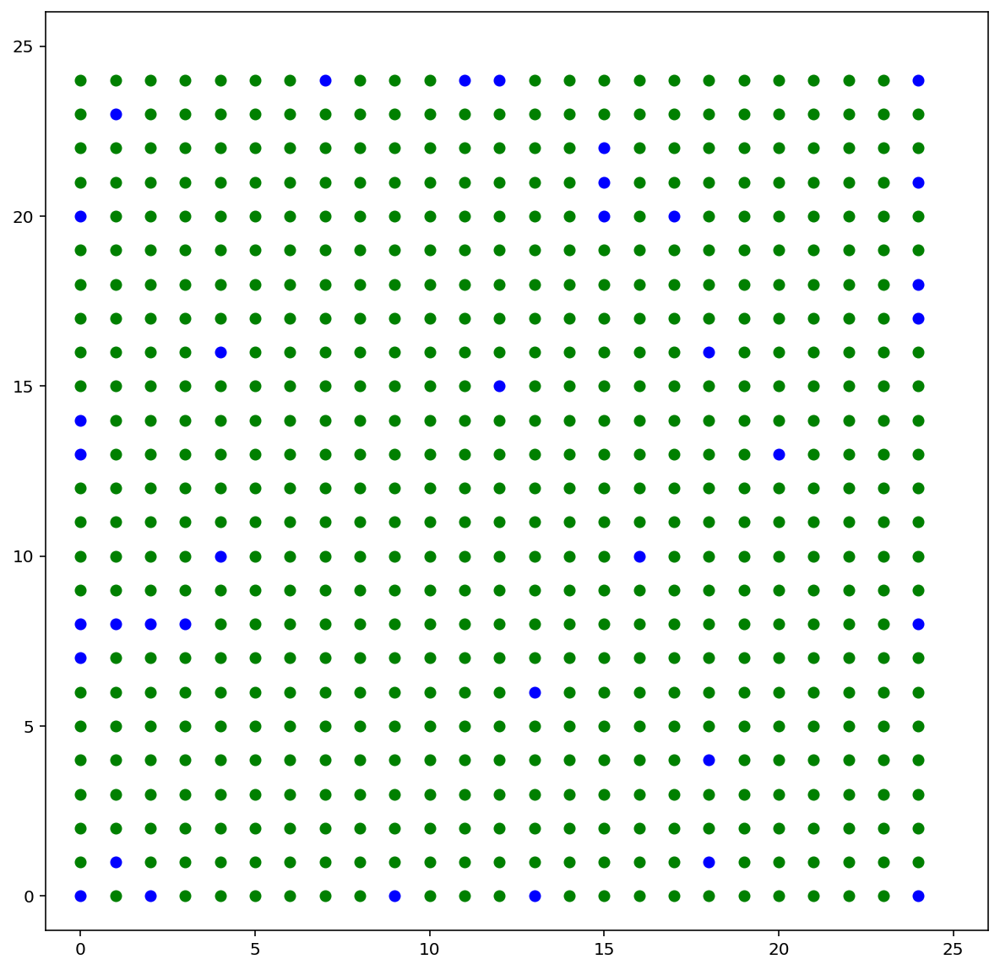

In [9]:
figure, axis = plt.subplots(figsize=(10, 10))
first, = plt.plot([], [], 'bo')
second, = plt.plot([], [], 'ro')
third, = plt.plot([], [], 'go')
n = 25
def update(idx):
    values = t2[idx]
    x1 = []
    x2 = []
    x3 = []
    y1 = []
    y2 = []
    y3 = []
    for i in range(n):
        for j in range(n):
            if(values[i][j] == 0):
                x1.append(i)
                y1.append(j)
            elif(values[i][j] == 1):
                x2.append(i)
                y2.append(j)
            else:
                x3.append(i)
                y3.append(j)
    
    first.set_data((x1,y1))
    second.set_data((x2,y2))
    third.set_data((x3,y3))
    return first,second,third


def init():
    axis.set_xlim((-1, 26))
    axis.set_ylim((-1, 26))
    return first,second,third


animation = FuncAnimation(figure, update, init_func=init, frames=len(t2),interval = 200)
HTML(animation.to_html5_video())

# Statystyki komórek w automacie

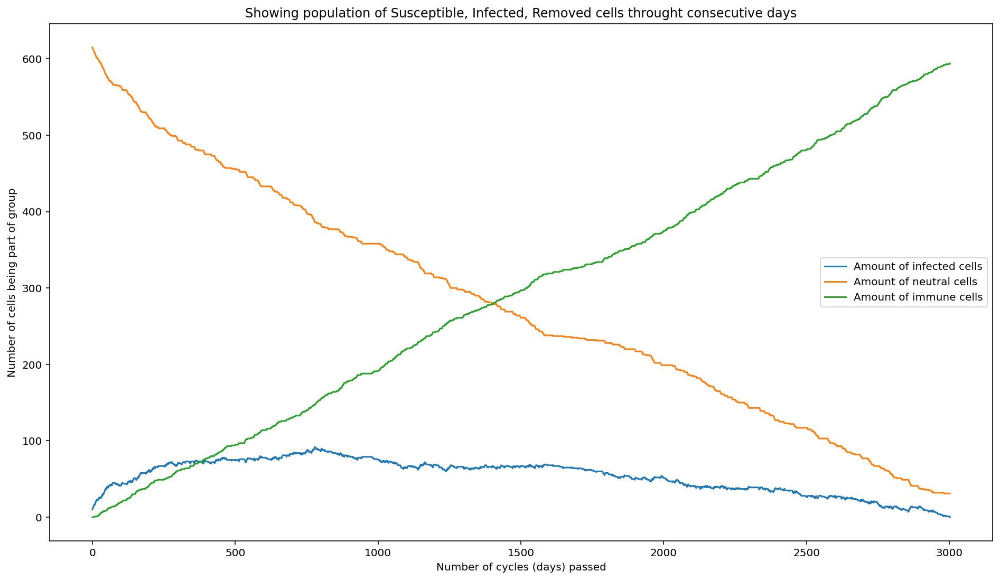

In [10]:
y = []
y2 = []
y3 = []
for el in t[1]:
    y.append(el[0])
    y2.append(el[1])
    y3.append(el[2])
    
y = np.array(y)
y2 = np.array(y2)
y3 = np.array(y3)
x = np.arange(0,len(t[1]),1)
plt.plot(x,y,label = 'Amount of infected cells')
plt.plot(x,y2,label = 'Amount of neutral cells')
plt.plot(x,y3,label = 'Amount of immune cells')
plt.title('Showing population of Susceptible, Infected, Removed cells throught consecutive days')
plt.xlabel('Number of cycles (days) passed')
plt.ylabel('Number of cells being part of group')
plt.legend()
plt.show()

## Symulacja dla 2500 pól, 25 poczatkowych infekcji oraz szansy na ozdrowienie równej 0.25

In [11]:
t = cellularAutomata(50,25,0.25)
t2 = cellularAutomataAnimation(50,25,0.25)

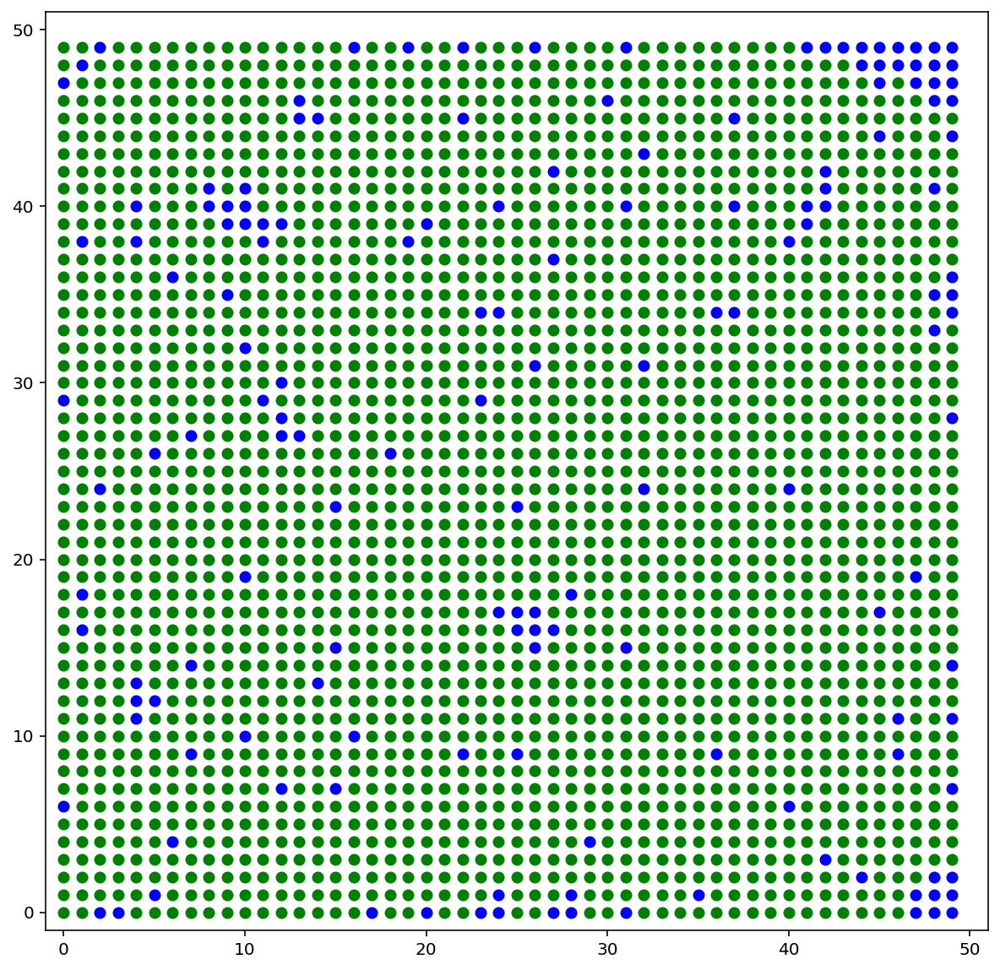

In [12]:
figure, axis = plt.subplots(figsize=(10, 10))
first, = plt.plot([], [], 'bo')
second, = plt.plot([], [], 'ro')
third, = plt.plot([], [], 'go')
n = 50
def update(idx):
    values = t2[idx]
    x1 = []
    x2 = []
    x3 = []
    y1 = []
    y2 = []
    y3 = []
    for i in range(n):
        for j in range(n):
            if(values[i][j] == 0):
                x1.append(i)
                y1.append(j)
            elif(values[i][j] == 1):
                x2.append(i)
                y2.append(j)
            else:
                x3.append(i)
                y3.append(j)
    
    first.set_data((x1,y1))
    second.set_data((x2,y2))
    third.set_data((x3,y3))
    return first,second,third


def init():
    axis.set_xlim((-1, 51))
    axis.set_ylim((-1, 51))
    return first,second,third


animation = FuncAnimation(figure, update, init_func=init, frames=len(t2),interval = 50)
HTML(animation.to_html5_video())

# Statystyki komórek w automacie

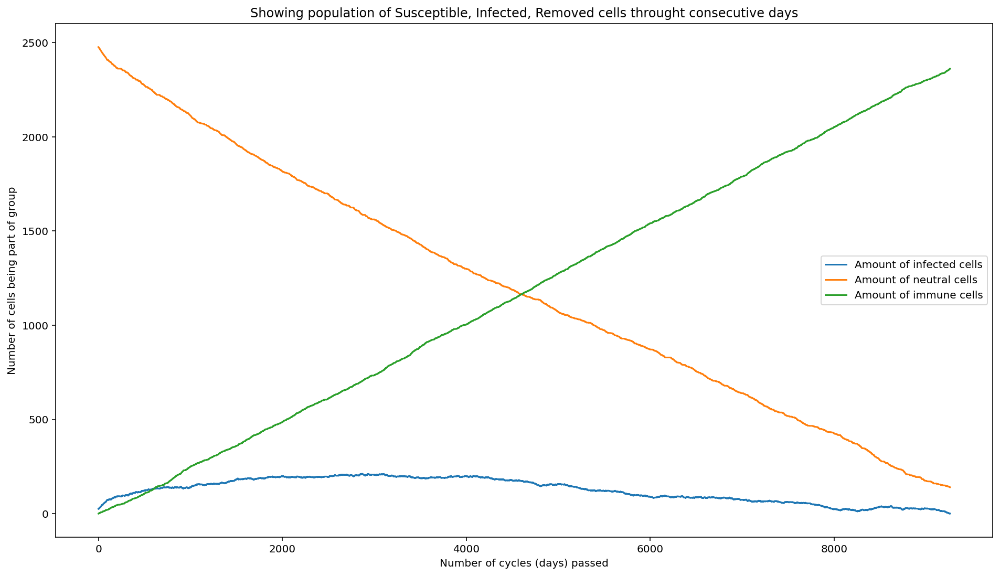

In [13]:
y = []
y2 = []
y3 = []
for el in t[1]:
    y.append(el[0])
    y2.append(el[1])
    y3.append(el[2])
    
y = np.array(y)
y2 = np.array(y2)
y3 = np.array(y3)
x = np.arange(0,len(t[1]),1)
plt.plot(x,y,label = 'Amount of infected cells')
plt.plot(x,y2,label = 'Amount of neutral cells')
plt.plot(x,y3,label = 'Amount of immune cells')
plt.title('Showing population of Susceptible, Infected, Removed cells throught consecutive days')
plt.xlabel('Number of cycles (days) passed')
plt.ylabel('Number of cells being part of group')
plt.legend()
plt.show()